# Udacity Self Driving Car Nanodegree
# Project 4 - Advanced Lane Lines

By James Marshall

### Imports

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import glob
import matplotlib.image as mpimg
import cv2
from moviepy.editor import VideoFileClip
from IPython.display import HTML

%matplotlib inline

## Camera Calibration

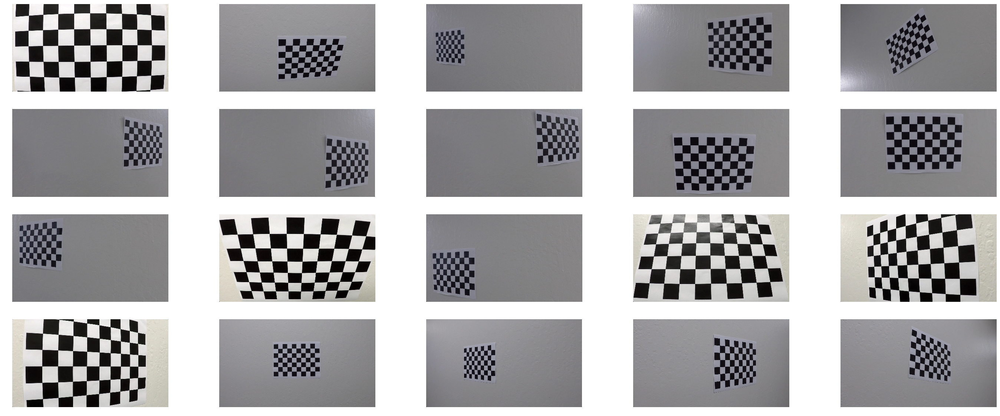

In [2]:
#Display the original Calibration images
fig, axs = plt.subplots(4,5, figsize=(50, 20))
fig.subplots_adjust(hspace = .2, wspace=.001)
axs = axs.ravel()

images = []

for i, img in enumerate(glob.glob('./camera_cal/*.jpg')):
    image = cv2.imread(img)
    axs[i].axis('off')
    axs[i].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    images.append(image)
    
images = np.asarray(images)

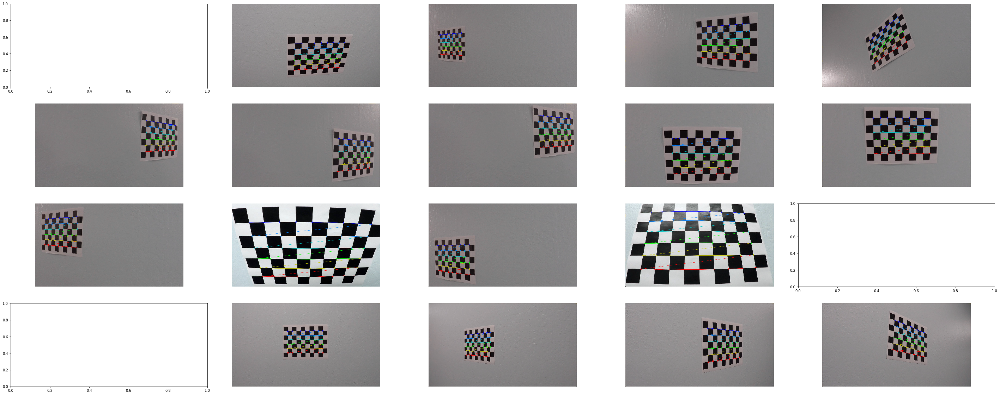

In [3]:
##Draw the corners on all of the calibration images and display

objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

objpoints = []
imgpoints = []

fig, axs = plt.subplots(4,5, figsize=(50, 20))
fig.subplots_adjust(hspace = .2, wspace=.001)
axs = axs.ravel()

for i, img in enumerate(images):

    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    ret, corners = cv2.findChessboardCorners(gray, (9, 6), None)

    if ret == True:
        imgpoints.append(corners)
        objpoints.append(objp)

        img = cv2.drawChessboardCorners(img, (9, 6), corners, ret)
        axs[i].axis('off')
        axs[i].imshow(img)

...


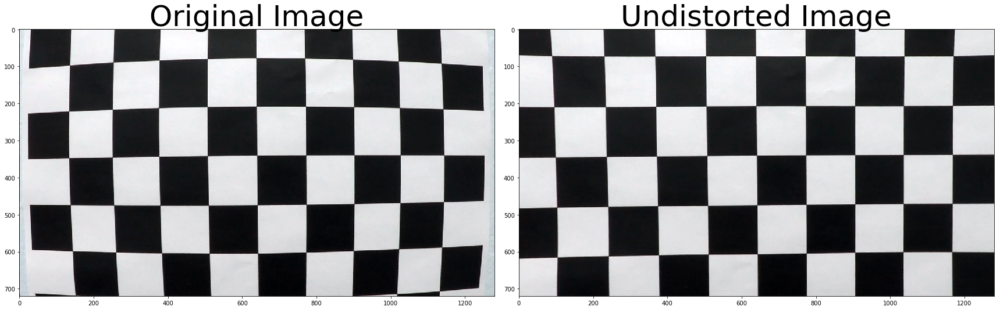

In [4]:
##Undistort one of the calibration images

img = images[0]

img_size = (img.shape[1], img.shape[0])

ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size, None, None)

dst = cv2.undistort(img, mtx, dist, None, mtx)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax2.imshow(dst)
ax1.set_title('Original Image', fontsize=50)
ax2.set_title('Undistorted Image', fontsize=50)
print('...')

## Test on an image from the test images

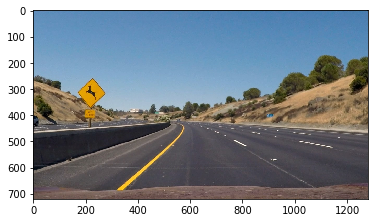

In [5]:
##Select the test image and display
test_img = cv2.imread('./test_images/test2.jpg')
test_img = cv2.cvtColor(test_img, cv2.COLOR_BGR2RGB)
plt.imshow(test_img)

In [6]:
##Distortion function
def undistort(img):
    undistorted = cv2.undistort(img, mtx, dist, None, mtx)
    return undistorted

...


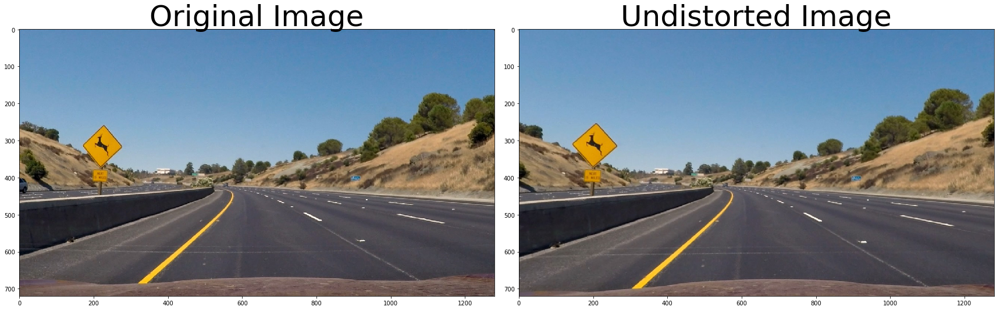

In [7]:
##Undistort the test image and compare the two
undistort_test = undistort(test_img)

##Visualise
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(test_img)
ax2.imshow(undistort_test)
ax1.set_title('Original Image', fontsize=50)
ax2.set_title('Undistorted Image', fontsize=50)
print('...')

## Unwarping

In [8]:
def warp(img, src, dst):
    img_size = (img.shape[1], img.shape[0])
    
    M = cv2.getPerspectiveTransform(src, dst)
    
    Minv = cv2.getPerspectiveTransform(dst, src)
    
    warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)
    
    return warped, M, Minv

## Perspective Transform applied to an image

Text(0.5,1,'Unwarped Image')

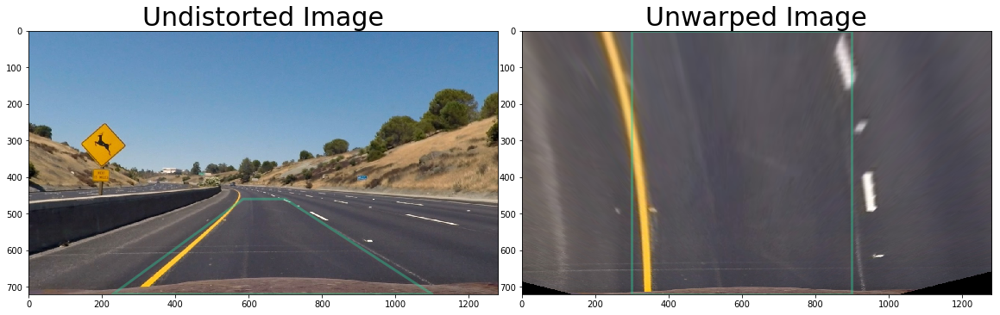

In [9]:
##Set variables
height, width = undistort_test.shape[:2]

src = np.float32(
    [[230, img_size[1]],
     [585, 460],
     [700, 460],
     [1100, img_size[1]]])
    
dst = np.float32(
    [[300, img_size[1]],
     [300, 0],
     [900, 0],
     [900, img_size[1]]])

unwarped_test, M, Minv = warp(undistort_test, src, dst)

##Visualize unwarp
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
f.subplots_adjust(hspace = .2, wspace=.05)
ax1.imshow(undistort_test)
x1 = [src[0][0],src[1][0],src[2][0],src[3][0],src[0][0]]
y1 = [src[0][1],src[1][1],src[2][1],src[3][1],src[0][1]]
x2 = [dst[0][0],dst[1][0],dst[2][0],dst[3][0],dst[0][0]]
y2 = [dst[0][1],dst[1][1],dst[2][1],dst[3][1],dst[0][1]]
ax1.plot(x1, y1, color='#33cc99', alpha=0.4, linewidth=3, solid_capstyle='round', zorder=2)
ax1.set_ylim([height, 0    ])
ax1.set_xlim([0     , width])
ax2.plot(x2, y2, color='#33cc99', alpha=0.4, linewidth=3, solid_capstyle='round', zorder=2)
ax2.set_ylim([height, 0    ])
ax2.set_xlim([0     , width])
ax1.set_title('Undistorted Image', fontsize=30)
ax2.imshow(unwarped_test)
ax2.set_title('Unwarped Image', fontsize=30)

## Absolute Threshold

In [10]:
def abs_sobel_thresh(img, orient='x', thresh_min=0, thresh_max=255):
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, orient == 'x', orient == 'y'))
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    binary_output = np.zeros_like(scaled_sobel)
    binary_output[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1
    return binary_output

## Visualise Absolute Sobel

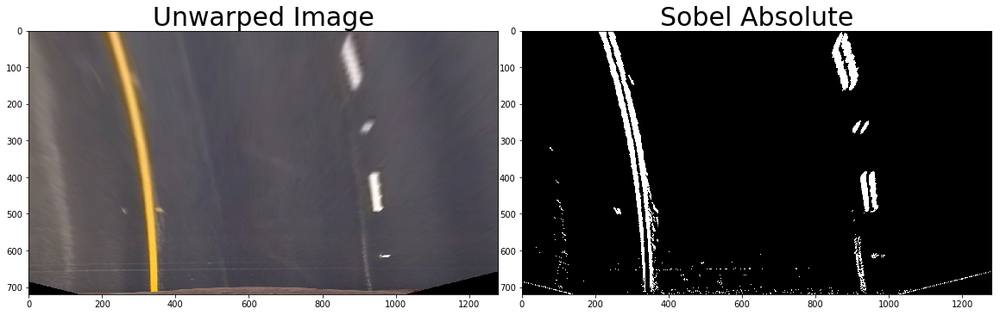

In [11]:
def visualise(min_thresh, max_thresh):
    #Using sobelx
    abs_sobel_test = abs_sobel_thresh(unwarped_test, 'x', min_thresh, max_thresh)
    #Visualise
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    f.subplots_adjust(hspace = .2, wspace=.05)
    ax1.imshow(unwarped_test)
    ax1.set_title('Unwarped Image', fontsize=30)
    ax2.imshow(abs_sobel_test, cmap='gray')
    ax2.set_title('Sobel Absolute', fontsize=30)

visualise(15, 200)

## Mag Threshold

In [12]:
def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1)
    mag_sobel = np.sqrt(sobelx**2 + sobely**2)
    scaled_sobel = np.uint8(255*mag_sobel/np.max(mag_sobel))
    binary_output = np.zeros_like(scaled_sobel)
    binary_output[(scaled_sobel >= mag_thresh[0]) & (scaled_sobel <= mag_thresh[1])] = 1
    return binary_output

## Visualise Mag Threshold

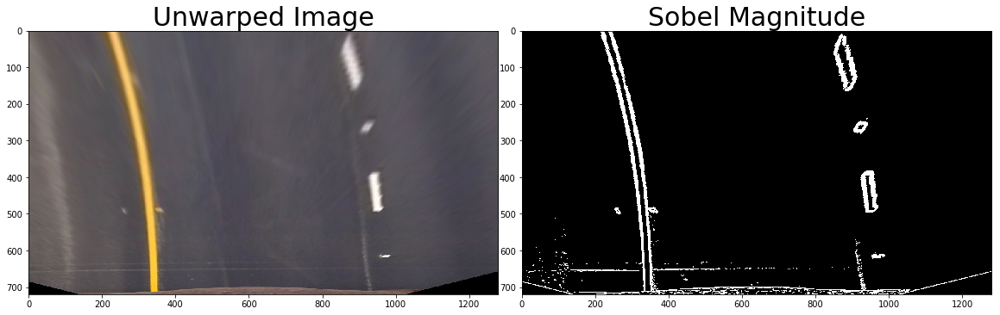

In [13]:
def visualise(kernel_size, min_thresh, max_thresh):
    mag_sobel_test = mag_thresh(unwarped_test, kernel_size, (min_thresh, max_thresh))
    #Visualise
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    f.subplots_adjust(hspace = .2, wspace=.05)
    ax1.imshow(unwarped_test)
    ax1.set_title('Unwarped Image', fontsize=30)
    ax2.imshow(mag_sobel_test, cmap='gray')
    ax2.set_title('Sobel Magnitude', fontsize=30)

visualise(11, 15, 200)

## Directional Threshold

In [14]:
def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    abs_sobelx = np.absolute(sobelx)
    abs_sobely = np.absolute(sobely)
    grad_dir_sobel = np.arctan2(abs_sobely, abs_sobelx)
    binary_output = np.zeros_like(grad_dir_sobel)
    binary_output[(grad_dir_sobel >= thresh[0]) & (grad_dir_sobel <= thresh[1])] = 1
    return binary_output

## Visualise Directional Threshold

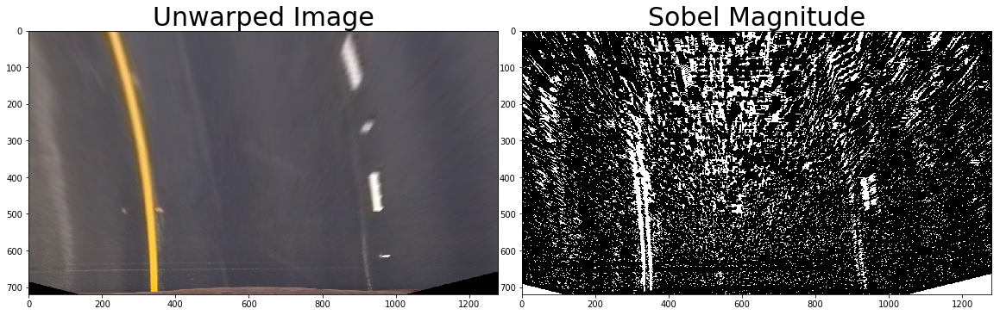

In [15]:
def visualise(kernel_size, min_thresh, max_thresh):
    dir_sobel_test = dir_threshold(unwarped_test, kernel_size, (min_thresh, max_thresh))
    #Visualise
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    f.subplots_adjust(hspace = .2, wspace=.05)
    ax1.imshow(unwarped_test)
    ax1.set_title('Unwarped Image', fontsize=30)
    ax2.imshow(dir_sobel_test, cmap='gray')
    ax2.set_title('Sobel Magnitude', fontsize=30)
    
visualise(11, 0, 0.2)

## Magnitude and Direction

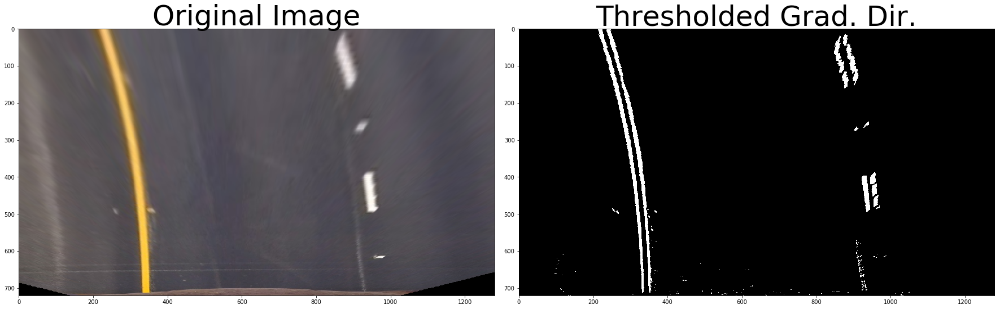

In [16]:
#Set up image and parameters
def visualise(mag_kernel, dir_kernel, mag_min, dir_min, mag_max, dir_max):
    mag_sobel_test2 = mag_thresh(unwarped_test, mag_kernel, (mag_min, mag_max))
    dir_sobel_test2 = dir_threshold(unwarped_test, dir_kernel, (dir_min, dir_max))
    
    combined = np.zeros_like(mag_sobel_test2)
    combined[((mag_sobel_test2 == 1) & (dir_sobel_test2 == 1))] = 1

    #Visualise
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(unwarped_test)
    ax1.set_title('Original Image', fontsize=50)
    ax2.imshow(combined, cmap='gray')
    ax2.set_title('Thresholded Grad. Dir.', fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    
    
visualise(mag_kernel=11, dir_kernel=11, mag_min=15, dir_min=0, mag_max=200, dir_max=0.5)

## HLS Select

## S Channel

In [17]:
def hls_sthresh(img, thresh=(0, 255)):
    img = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    s_channel = img[:,:,2]
    binary_output = np.zeros_like(s_channel)
    binary_output[(s_channel > thresh[0]) & (s_channel <= thresh[1])] = 1
    return binary_output

## Visualising S Channel

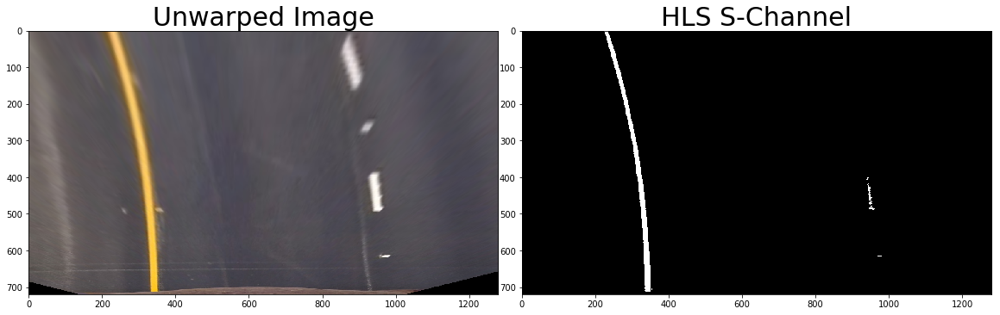

In [18]:
def visualise(min_thresh, max_thresh):
    Sthresh_test = hls_sthresh(unwarped_test, (min_thresh, max_thresh))
    #Visualise
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    f.subplots_adjust(hspace = .2, wspace=.05)
    ax1.imshow(unwarped_test)
    ax1.set_title('Unwarped Image', fontsize=30)
    ax2.imshow(Sthresh_test, cmap='gray')
    ax2.set_title('HLS S-Channel', fontsize=30)
    
visualise(190, 255)

## L Channel

In [19]:
def hls_lthresh(img, thresh=(0, 255)):
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    hls_l = hls[:,:,1]
    hls_l = hls_l*(255/np.max(hls_l))
    binary_output = np.zeros_like(hls_l)
    binary_output[(hls_l > thresh[0]) & (hls_l <= thresh[1])] = 1
    return binary_output

## Visualising L Channel

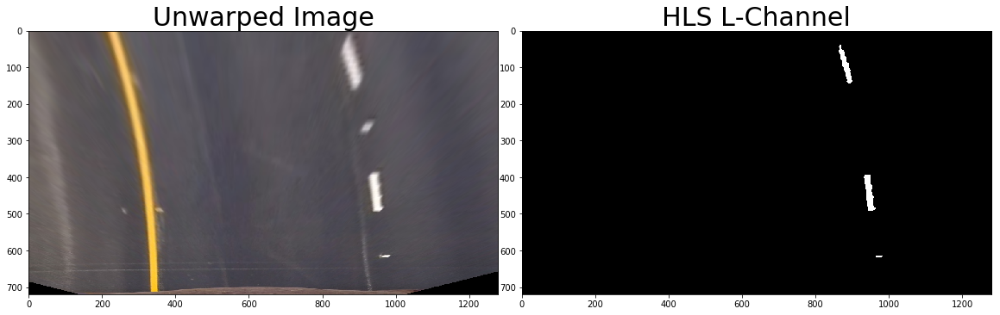

In [20]:
def visualise(min_thresh, max_thresh):
    Lthresh_test = hls_lthresh(unwarped_test, (min_thresh, max_thresh))
    #Visualise
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    f.subplots_adjust(hspace = .2, wspace=.05)
    ax1.imshow(unwarped_test)
    ax1.set_title('Unwarped Image', fontsize=30)
    ax2.imshow(Lthresh_test, cmap='gray')
    ax2.set_title('HLS L-Channel', fontsize=30)
    
visualise(210, 255)

## LAB Colourspace

## B Channel

In [21]:
def lab_bthresh(img, thresh=(190,255)):
    lab = cv2.cvtColor(img, cv2.COLOR_RGB2Lab)
    lab_b = lab[:,:,2]
    if np.max(lab_b) > 175:
        lab_b = lab_b*(255/np.max(lab_b))
    binary_output = np.zeros_like(lab_b)
    binary_output[((lab_b > thresh[0]) & (lab_b <= thresh[1]))] = 1
    return binary_output

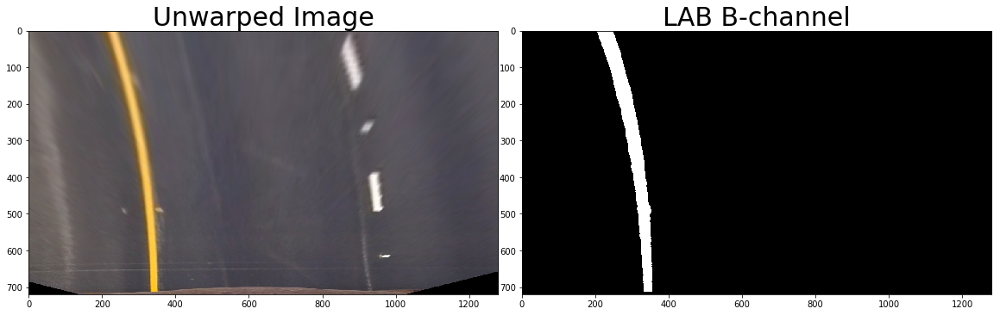

In [22]:
def visualise(min_b_thresh, max_b_thresh):
    BThresh_test = lab_bthresh(unwarped_test, (min_b_thresh, max_b_thresh))
    # Visualize
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    f.subplots_adjust(hspace = .2, wspace=.05)
    ax1.imshow(unwarped_test)
    ax1.set_title('Unwarped Image', fontsize=30)
    ax2.imshow(BThresh_test, cmap='gray')
    ax2.set_title('LAB B-channel', fontsize=30)
    
visualise(185,255)

## Combining Colour and Gradient

In [23]:
def image_pipeline(img):
    #Undistort the image
    undistorted_img = undistort(img)
    #Unwarp the image
    unwarped, M, Minv = warp(undistorted_img, src, dst)
    
    mag_thresh_img = mag_thresh(unwarped, 11, (15, 200))
    
    dir_thresh_img = dir_threshold(unwarped, 11, (0, 0.2))
    
    Sthresh = hls_sthresh(unwarped, (130, 255))
    
    Lthresh = hls_lthresh(unwarped, (210, 255))
    
    B_thresh = lab_bthresh(unwarped, (185, 255))
    
    combined = np.zeros_like(Lthresh)
    combined[((Lthresh == 1) | (B_thresh == 1))] = 1
    
    return combined, Minv


## Run Pipeline on single image

Text(0.5,1,'Pipeline Image')

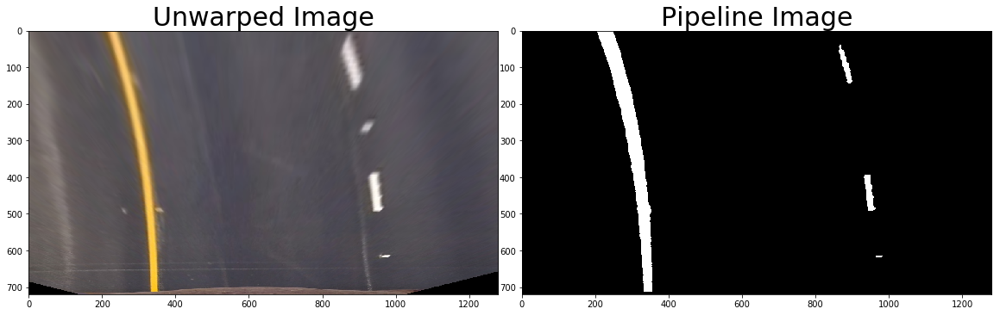

In [24]:
pipeline_test = cv2.imread('./test_images/test2.jpg')
pipeline_test = cv2.cvtColor(pipeline_test, cv2.COLOR_BGR2RGB)
pipeline_test, _ = image_pipeline(pipeline_test)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
f.subplots_adjust(hspace = .2, wspace=.05)
ax1.imshow(unwarped_test)
ax1.set_title('Unwarped Image', fontsize=30)
ax2.imshow(pipeline_test, cmap='gray')
ax2.set_title('Pipeline Image', fontsize=30)

## Histogram of the pixel distribution

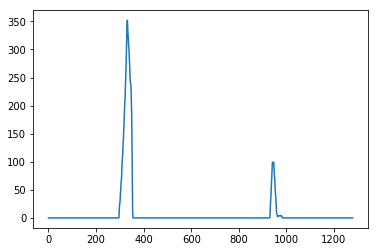

In [25]:
hist_test = cv2.imread('./test_images/test2.jpg')
hist_test = cv2.cvtColor(hist_test, cv2.COLOR_BGR2RGB)
hist_test, Minv = image_pipeline(hist_test)

histogram = np.sum(hist_test[hist_test.shape[0]//2:,:], axis=0)
plt.plot(histogram)

In [26]:
def sliding_window_lanes(img):
    histogram = np.sum(img[img.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((img, img, img))*255
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    quarter_point = np.int(midpoint//2)
    leftx_base = np.argmax(histogram[quarter_point:midpoint]) + quarter_point
    rightx_base = np.argmax(histogram[midpoint:(midpoint+quarter_point)]) + midpoint
    
    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_height = np.int(img.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = img.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = img.shape[0] - (window+1)*window_height
        win_y_high = img.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),
        (0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),
        (0,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a quadratic polynomial to each line
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    return left_fit, right_fit, left_lane_inds, right_lane_inds, nonzeroy, nonzerox, out_img

## Visualising the sliding windows

(720, 0)

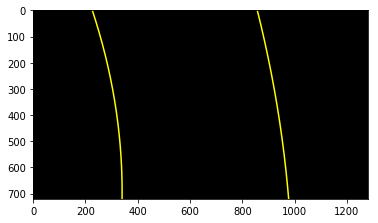

In [27]:
left_fit, right_fit, left_lane_inds, right_lane_inds, nonzeroy, nonzerox, out_img = sliding_window_lanes(hist_test)
    
# Generate x and y values for plotting
ploty = np.linspace(0, hist_test.shape[0]-1, hist_test.shape[0] )
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
plt.imshow(out_img)
plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')
plt.xlim(0, 1280)
plt.ylim(720, 0)

In [28]:
def sliding_window_with_prev(img, left_fit_prev, right_fit_prev):
    # Assume you now have a new warped binary image 
    # from the next frame of video (also called "binary_warped")
    # It's now much easier to find line pixels!
    nonzero = img.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 80
    left_lane_inds = ((nonzerox > (left_fit_prev[0]*(nonzeroy**2) + left_fit_prev[1]*nonzeroy + 
    left_fit_prev[2] - margin)) & (nonzerox < (left_fit_prev[0]*(nonzeroy**2) + 
    left_fit_prev[1]*nonzeroy + left_fit_prev[2] + margin))) 

    right_lane_inds = ((nonzerox > (right_fit_prev[0]*(nonzeroy**2) + right_fit_prev[1]*nonzeroy + 
    right_fit_prev[2] - margin)) & (nonzerox < (right_fit_prev[0]*(nonzeroy**2) + 
    right_fit_prev[1]*nonzeroy + right_fit_prev[2] + margin)))  

    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    
    left_fit_new, right_fit_new = (None, None)
    # Fit a quadratic polynomial to each line
    left_fit_new = np.polyfit(lefty, leftx, 2)
    right_fit_new = np.polyfit(righty, rightx, 2)
        
    return left_fit_new, right_fit_new, left_lane_inds, right_lane_inds

(720, 0)

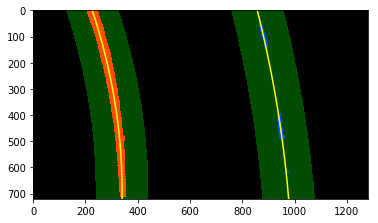

In [29]:
# visualize the result on example image
sliding_window_test = cv2.imread('./test_images/test2.jpg')
sliding_window_test = cv2.cvtColor(sliding_window_test, cv2.COLOR_BGR2RGB)
sliding_window_test, Minv = image_pipeline(sliding_window_test)   
margin = 100

left_fit2, right_fit2, left_lane_inds2, right_lane_inds2 = sliding_window_with_prev(sliding_window_test, left_fit, right_fit)

# Generate x and y values for plotting
ploty = np.linspace(0, sliding_window_test.shape[0]-1, sliding_window_test.shape[0] )
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
left_fitx2 = left_fit2[0]*ploty**2 + left_fit2[1]*ploty + left_fit2[2]
right_fitx2 = right_fit2[0]*ploty**2 + right_fit2[1]*ploty + right_fit2[2]

# Create an image to draw on and an image to show the selection window
out_img = np.uint8(np.dstack((sliding_window_test, sliding_window_test, sliding_window_test))*255)
window_img = np.zeros_like(out_img)

# Color in left and right line pixels
nonzero = sliding_window_test.nonzero()
nonzeroy = np.array(nonzero[0])
nonzerox = np.array(nonzero[1])
out_img[nonzeroy[left_lane_inds2], nonzerox[left_lane_inds2]] = [255, 0, 0]
out_img[nonzeroy[right_lane_inds2], nonzerox[right_lane_inds2]] = [0, 0, 255]

# Generate a polygon to illustrate the search window area (OLD FIT)
# And recast the x and y points into usable format for cv2.fillPoly()
left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, ploty])))])
left_line_pts = np.hstack((left_line_window1, left_line_window2))
right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, ploty])))])
right_line_pts = np.hstack((right_line_window1, right_line_window2))

# Draw the lane onto the warped blank image
cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
plt.imshow(result)
plt.plot(left_fitx2, ploty, color='yellow')
plt.plot(right_fitx2, ploty, color='yellow')
plt.xlim(0, 1280)
plt.ylim(720, 0)

In [30]:
def draw_lane(original_img, binary_img, left_fit, right_fit, Minv):
    new_img = np.copy(original_img)

    # Create an image to draw the lines on
    warp_zero = np.zeros_like(binary_img).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    
    height, width = binary_img.shape
    ploty = np.linspace(0, height-1, num=height)# to cover same y-range as image
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
    cv2.polylines(color_warp, np.int32([pts_left]), isClosed=False, color=(255,0,255), thickness=15)
    cv2.polylines(color_warp, np.int32([pts_right]), isClosed=False, color=(0,255,255), thickness=15)

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (width, height)) 
    # Combine the result with the original image
    result = cv2.addWeighted(new_img, 1, newwarp, 0.5, 0)
    return result

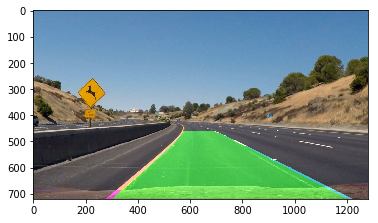

In [31]:
overlay_test = draw_lane(test_img, sliding_window_test, left_fit2, right_fit2, Minv)
plt.imshow(overlay_test)

## Radius of curvature and distance from centre of lane

In [50]:
def radius_and_distance(img, left_fit, right_fit, left_lane_inds, right_lane_inds):
    ##TODO: Fix function
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 3.048/100 # meters per pixel in y dimension
    xm_per_pix = 3.7/900 # meters per pixel in x dimension

    left_curve = 0
    right_curve = 0
    center = 0
    # Define y-value where we want radius of curvature
    # I'll choose the maximum y-value, corresponding to the bottom of the image
    h = img.shape[0]
    ploty = np.linspace(0, h-1, h)
    y_eval = np.max(ploty)
  
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = img.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    
    if len(leftx) != 0 and len(rightx) != 0:
        # Fit new polynomials to x,y in world space
        left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
        right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
        # Calculate the new radii of curvature
        left_curve = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
        right_curve = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])

    
    if right_fit is not None and left_fit is not None:
        h = img.shape[0]
        car_position = img.shape[1]/2
        l_fit_x_int = left_fit[0]*h**2 + left_fit[1]*h + left_fit[2]
        r_fit_x_int = right_fit[0]*h**2 + right_fit[1]*h + right_fit[2] + 50
        lane_center_position = (r_fit_x_int + l_fit_x_int) /2
        centre = (car_position - lane_center_position) * xm_per_pix
    
    return left_curve, right_curve, centre

In [51]:
rad_l, rad_r, d_center = radius_and_distance(sliding_window_test, left_fit2, right_fit2, left_lane_inds2, right_lane_inds2)

print('Radius of curvature for example:', rad_l, 'm,', rad_r, 'm')
print('Distance from lane center for example:', d_center, 'm')

Radius of curvature for example: 475.846826595 m, 971.306915425 m
Distance from lane center for example: -0.179501717454 m


## Show radius and distance from centre

In [52]:
def draw_data(original_img, curv_rad, center_dist):
    new_img = np.copy(original_img)
    h = new_img.shape[0]
    font = cv2.FONT_HERSHEY_DUPLEX
    text = 'Curve radius: ' + '{:04.2f}'.format(curv_rad) + 'm'
    cv2.putText(new_img, text, (40,70), font, 1.5, (200,255,155), 2, cv2.LINE_AA)
    direction = ''
    if center_dist > 0:
        direction = 'right'
    elif center_dist < 0:
        direction = 'left'
    abs_center_dist = abs(center_dist)
    text = '{:04.3f}'.format(abs_center_dist) + 'm ' + direction + ' of center'
    cv2.putText(new_img, text, (40,120), font, 1.5, (200,255,155), 2, cv2.LINE_AA)
    return new_img

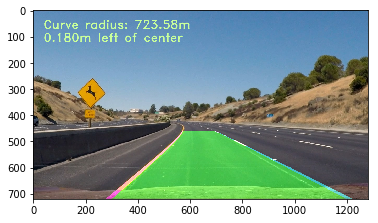

In [53]:
data_example = draw_data(overlay_test, (rad_l+rad_r)/2, d_center)
plt.imshow(data_example)

In [54]:
class Line():
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False  
        # x values of the last n fits of the line
        self.recent_xfitted = [] 
        #average x values of the fitted line over the last n iterations
        self.bestx = None     
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None  
        #polynomial coefficients for the most recent fit
        self.current_fit = [np.array([False])]  
        #radius of curvature of the line in some units
        self.radius_of_curvature = None 
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        #x values for detected line pixels
        self.allx = None  
        #y values for detected line pixels
        self.ally = None
    def add_fit(self, fit, inds):
        if self.best_fit is not None:
            # if we have a best fit, see how this new fit compares
            self.diffs = abs(fit-self.best_fit)
        if (self.diffs[0] > 0.001 or \
            self.diffs[1] > 1.0 or \
            self.diffs[2] > 100.) and \
            len(self.current_fit) > 0:
            #bad fit
                self.detected = False
        else:
            self.detected = True
            self.px_count = np.count_nonzero(inds)
            self.current_fit = fit
            self.best_fit = self.current_fit


In [55]:
def process_image(img):
    new_img = np.copy(img)
    img_bin, Minv = image_pipeline(new_img)
    
    # if both left and right lines were detected last frame, use polyfit_using_prev_fit, otherwise use sliding window
    if not l_line.detected or not r_line.detected:
        left_fit, right_fit, left_lane_inds, right_lane_inds, _, _, _ = sliding_window_lanes(img_bin)
    else:
        left_fit, right_fit, left_lane_inds, right_lane_inds = sliding_window_with_prev(img_bin, l_line.best_fit, r_line.best_fit)
        
    if left_fit is not None and right_fit is not None:
        # calculate x-intercept (bottom of image, x=image_height) for fits
        h = img.shape[0]
        left_fit_x_int = left_fit[0]*h**2 + left_fit[1]*h + left_fit[2]
        right_fit_x_int = right_fit[0]*h**2 + right_fit[1]*h + right_fit[2]
        x_int_diff = abs(right_fit_x_int-left_fit_x_int)
            
    l_line.add_fit(left_fit, left_lane_inds)
    r_line.add_fit(right_fit, right_lane_inds)
    # draw the current best fit if it exists
    if l_line.best_fit is not None and r_line.best_fit is not None:
        img_out1 = draw_lane(new_img, img_bin, l_line.best_fit, r_line.best_fit, Minv)
        rad_l, rad_r, d_center = radius_and_distance(img_bin, l_line.best_fit, r_line.best_fit, 
                                                               left_lane_inds, right_lane_inds)
        img_out = draw_data(img_out1, (rad_l+rad_r)/2, d_center)
    else:
        img_out = new_img
        
    return img_out

In [56]:
l_line = Line()
r_line = Line()
video_output1 = 'project_video_output.mp4'
video_input1 = VideoFileClip('project_video.mp4')#.subclip(0,5)
processed_video = video_input1.fl_image(process_image)
%time processed_video.write_videofile(video_output1, audio=False)

[MoviePy] >>>> Building video project_video_output.mp4
[MoviePy] Writing video project_video_output.mp4


100%|█████████████████████████████████████████████████████████████████████████████▉| 1260/1261 [03:37<00:00,  6.07it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_output.mp4 

Wall time: 3min 38s
